## Quick eda notebook to look at the seasonality of the Dutch power consumption data

In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
# Load and set index to datetime
df = pd.read_csv('../data/processed/NL_hourly_load_2006-2025.csv')
df['DateUTC'] = pd.to_datetime(df['DateUTC'])
df.set_index('DateUTC', inplace=True)

In [3]:
# Check for missing values
if df.isnull().sum().values[0] > 0:
    print(f"There are {df.isnull().sum().values[0]} missing values in the dataset. Linearly interpolating missing values.")
    # Interpolate NaN values to the mean of left and right values
    df['Load'] = df['Load'].interpolate(method='linear')

There are 10 missing values in the dataset. Linearly interpolating missing values.


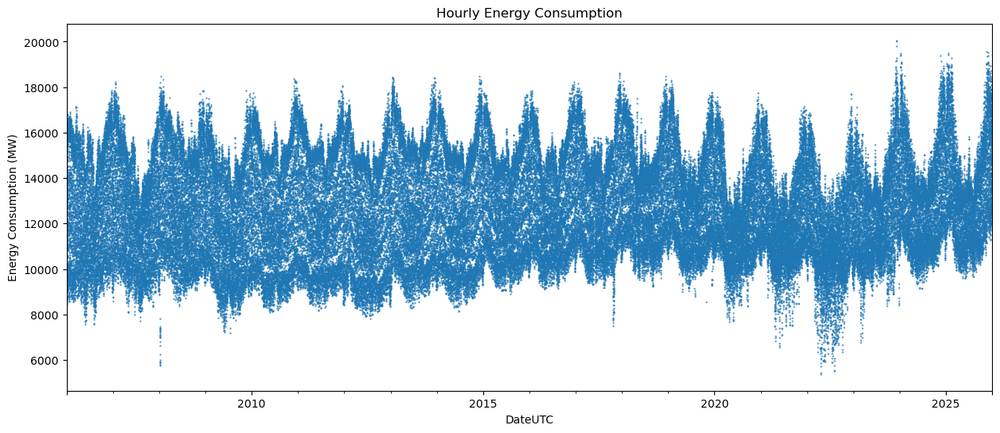

In [4]:
# Take out the obvious outliers using a rolling window of 1 week and a z-score threshold of 3
s = df['Load'].copy()
window = 24 * 7 # 1 week

rollingWindow = s.rolling(window=window, min_periods=1, center=True)
mean = rollingWindow.mean()
std = rollingWindow.std(ddof=0)
z = s.sub(mean).div(std)

m = z.between(-3, 3)
df['Load'] = s.where(m, np.nan).interpolate(method='linear')

# Plot the hourly energy consumption
df['Load'].plot(style='.', figsize=(15, 6), title='Hourly Energy Consumption', markersize=1)
plt.ylabel('Energy Consumption (MW)')
plt.show()

In [5]:
px.line(df, x=df.index, y='Load', title='Hourly Energy Consumption', labels={'Load': 'Energy Consumption (MW)'})

In [6]:
# Because the data pre-2015 is not standardised in time, let's ignore it for now and only use the data from 2015 onwards. We can always add the pre-2015 data later if we want to.
df = df[df.index >= '2015-01-01'].copy()

Average load: 12747.86 MW


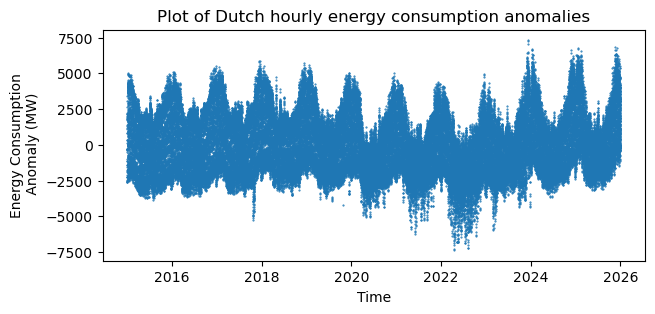

In [7]:
# Let's create a centered version of the data to make it easier to see the patterns in the data.
average_load = df['Load'].mean()
print(f"Average load: {average_load:.2f} MW")

df['LoadAnomaly'] = df['Load'].values - average_load
N = len(df['LoadAnomaly'])

plt.figure(figsize=(7, 3))
plt.plot(df['LoadAnomaly'], '.', markersize=1)
plt.xlabel('Time')
plt.ylabel('Energy Consumption\n Anomaly (MW)')
plt.title('Plot of Dutch hourly energy consumption anomalies')
plt.show()

In [8]:
## We are going to try and predict the load values, so let's give our data some features that we can use for prediction
df['HourOfDay'] = df.index.hour
df['DayOfWeek'] = df.index.dayofweek
df['MonthOfYear'] = df.index.month
df['Season'] = df['MonthOfYear'].apply(lambda x: (x%12 + 3)//3)  # 1: Spring, 2: Summer, 3: Autumn, 4: Winter
df['HoursSinceStart'] = df['DayOfWeek'] * 24 + df['HourOfDay']

In [ ]:
from arraylake import Client
import xarray as xr

client = Client()
repo = client.get_repo("earthmover-public/era5")
session = repo.readonly_session(branch="main")
ds_temporal = xr.open_zarr(session.store, group="single/temporal", chunks=None, decode_cf=False)

#interp(
#    longitude=xr.DataArray([4.8936, 4.4792, 4.3164, 5.1214, 5.4768, 6.5667], dims="longitude"),
#    latitude=xr.DataArray([52.3728, 51.9225, 52.0787, 52.0907, 51.4344, 53.2192], dims="latitude"),   
#)



In [24]:
df.index.min(), df.index.max()

(Timestamp('2015-01-01 00:00:00'), Timestamp('2025-12-31 23:00:00'))

In [28]:
# Hours between 2015-01-01 and 1940-01-01
print((df.index.min() - pd.Timestamp("1940-01-01")).total_seconds() / 3600)

# Hours between 2025-12-31 and 1940-01-01
print(( df.index.max() - pd.Timestamp("1940-01-01")).total_seconds() / 3600)

657456.0
753887.0


In [29]:
location_ts = ds_temporal.t2m.sel(valid_time=slice("657456", "753887"))

In [30]:
locations_lon = [4.8936, 4.4792, 4.3164, 5.1214, 5.4768, 6.5667]
locations_lat = [52.3728, 51.9225, 52.0787, 52.0907, 51.4344, 53.2192]
locations_names = ['Amsterdam', 'Rotterdam', 'The Hague', 'Utrecht', 'Eindhoven', 'Groningen']

x = xr.DataArray(locations_lon, dims="points")
y = xr.DataArray(locations_lat, dims="points")

interped_location_ts = location_ts.interp(longitude=x, latitude=y)

In [32]:
df.index

DatetimeIndex(['2015-01-01 00:00:00', '2015-01-01 01:00:00',
               '2015-01-01 02:00:00', '2015-01-01 03:00:00',
               '2015-01-01 04:00:00', '2015-01-01 05:00:00',
               '2015-01-01 06:00:00', '2015-01-01 07:00:00',
               '2015-01-01 08:00:00', '2015-01-01 09:00:00',
               ...
               '2025-12-31 14:00:00', '2025-12-31 15:00:00',
               '2025-12-31 16:00:00', '2025-12-31 17:00:00',
               '2025-12-31 18:00:00', '2025-12-31 19:00:00',
               '2025-12-31 20:00:00', '2025-12-31 21:00:00',
               '2025-12-31 22:00:00', '2025-12-31 23:00:00'],
              dtype='datetime64[us]', name='DateUTC', length=96432, freq=None)

In [31]:
interped_location_ts

<xarray.DataArray 't2m' (valid_time: 96432, points: 6)> Size: 5MB
array([[276.65530354, 275.64032878, 276.96909166, 275.06736529,
        273.81220596, 276.38862188],
       [276.48876478, 275.4896794 , 276.84912506, 274.83366925,
        273.55129678, 276.24873126],
       [276.43584166, 275.34695774, 276.77649461, 274.66814331,
        273.48074521, 276.21512371],
       ...,
       [277.8483061 , 277.04662753, 278.02911106, 276.32978161,
        274.84535365, 277.96374685],
       [278.02705396, 277.98177826, 278.6212116 , 276.78005267,
        275.49719049, 277.52224328],
       [278.30504353, 278.28105575, 278.8467401 , 277.07449554,
        275.50213164, 277.12638063]], shape=(96432, 6))
Coordinates:
  * valid_time  (valid_time) int64 771kB 657456 657457 657458 ... 753886 753887
    longitude   (points) float64 48B 4.894 4.479 4.316 5.121 5.477 6.567
    latitude    (points) float64 48B 52.37 51.92 52.08 52.09 51.43 53.22
Dimensions without coordinates: points
Attributes: (12/34)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      1038240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    long_name:                                2 metre temperature
    units:                                    K
    standard_name:                            unknown
    GRIB_surface:                             0.0
    coordinates:                              lsm
    _FillValue:                               nan

In [33]:
locations_names

['Amsterdam', 'Rotterdam', 'The Hague', 'Utrecht', 'Eindhoven', 'Groningen']

In [38]:
# Add 2m temperature (in Celsius) at the 6 locations as features to the dataframe
for i, name in enumerate(locations_names):
    df[name+'Temp'] = interped_location_ts.sel(points=i).values -273.15

In [41]:
df['RotterdamTemp'].describe()

count    96432.000000
mean        11.381983
std          6.366663
min         -9.328291
25%          6.684036
50%         11.129115
75%         15.980305
max         38.126939
Name: RotterdamTemp, dtype: float64

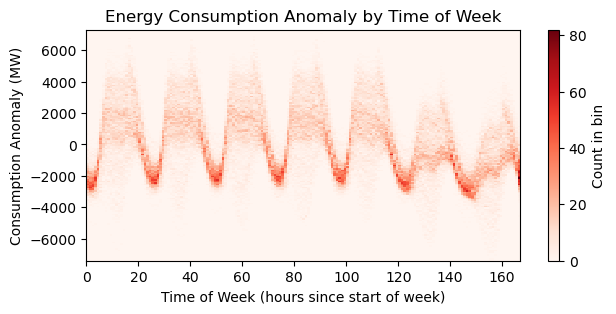

In [54]:
plt.figure(figsize=(7, 3))
plt.hist2d(df['HoursSinceStart'], df['LoadAnomaly'],
           bins=[np.arange(0,7*24,1), np.arange(-7400,7400,100)], cmap='Reds')
plt.colorbar(label='Count in bin')
plt.xlabel('Time of Week (hours since start of week)')
plt.ylabel('Consumption Anomaly (MW)')
plt.title('Energy Consumption Anomaly by Time of Week')
plt.show()

In [47]:
df['HoursSinceStart'].describe(), 7*24

(count    96432.000000
 mean        83.500000
 std         48.496815
 min          0.000000
 25%         41.750000
 50%         83.500000
 75%        125.250000
 max        167.000000
 Name: HoursSinceStart, dtype: float64,
 168)

In [56]:
px.line(df, x=df.index, y='RotterdamTemp', title='Rotterdam Temperature', labels={'RotterdamTemp': 'Temperature (°C)'})

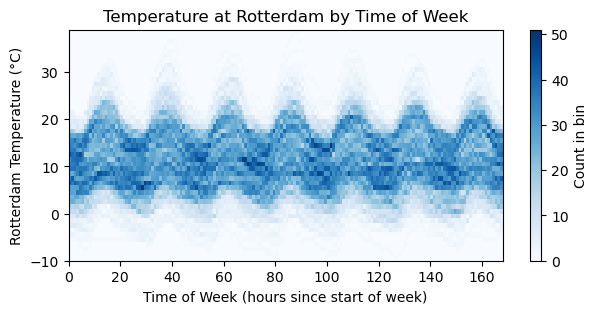

In [54]:
plt.figure(figsize=(7, 3))
plt.hist2d(df['HoursSinceStart'], df['RotterdamTemp'],
           bins=[np.arange(0,7*24+1,1), np.arange(-10,40,1)], cmap='Blues')
plt.colorbar(label='Count in bin')
plt.xlabel('Time of Week (hours since start of week)')
plt.ylabel('Rotterdam Temperature (°C)')
plt.title('Temperature at Rotterdam by Time of Week')
plt.show()

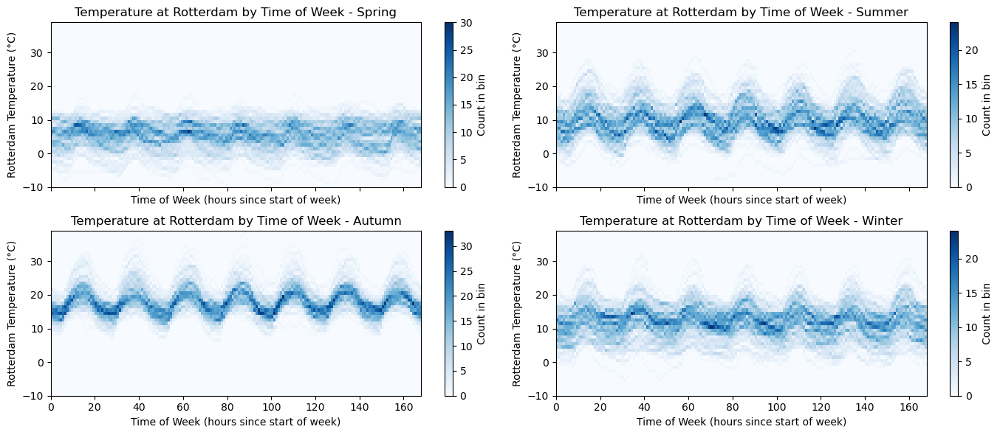

In [55]:
# Let's split this up by season to see if there are any differences in the patterns between seasons.

def plot_hist2d_by_season(axis, df_season, season_name):
    axis.hist2d(df_season['HoursSinceStart'], df_season['RotterdamTemp'],
                bins=[np.arange(0,7*24+1,1), np.arange(-10,40,1)], cmap='Blues')
    axis.set_xlabel('Time of Week (hours since start of week)')
    axis.set_ylabel('Rotterdam Temperature (°C)')
    axis.set_title(f'Temperature at Rotterdam by Time of Week - {season_name}')
    plt.colorbar(axis.collections[0], ax=axis, label='Count in bin')

fig, axs = plt.subplots(2, 2, figsize=(14, 6), sharex=True)
plot_hist2d_by_season(axs[0, 0], df[df['Season'] == 1], 'Spring')
plot_hist2d_by_season(axs[0, 1], df[df['Season'] == 2], 'Summer')
plot_hist2d_by_season(axs[1, 0], df[df['Season'] == 3], 'Autumn')
plot_hist2d_by_season(axs[1, 1], df[df['Season'] == 4], 'Winter')
plt.tight_layout()
plt.show()

In [ ]:
#TODO: Now start building a model that uses these features (and likely some more) to predict the load values.
# Start from the XGBoost model from previous work and add the new features to see if it improves the performance.